# Run 2.2i Object Tables with Dask+Holoviews
<br>Owner: **Michael Wood-Vasey** ([@wmwv](https://github.com/LSSTDESC/DC2-analysis/issues/new?body=@wmwv))
<br>Last Verified to Run: **2020-07-09**
    
* Demonstrate the use of the DPDD-style Object table in Parquet format. 
* Uses Dask+Holoviews+Datashader to demonstrate visualizing the entire dataset.

Learning Objectives:
After completing and studying this Notebook, a person should be able to
1. Load a Parquet file with Dask.
    - Understand that specifying the columns to select increases performance.
2. Make a plot using Holoviews
3. Use Datashader to interactively rasterize a large dataset for display.
4. Launch a set of Dask workers on a SLURM qos=interactive job.

Logistics:

1. These tests were conducted on NERSC through the https://jupyter.nersc.gov interface.

2. Requires:
```
dask
dask.distributed
holoviews
datashader
bokeh
pyarrow >= 0.13.1
```

These were used with `desc-python-bleed` kernel

3. This was run using the `desc-python-bleed` kernel

Current Status:
* Quick demonstration for people who want to check out the Parquet file and learn.
* Future work planned to demonstrate selection, brushing, and simple outlier identification.

References:  
    https://dask.org  
    https://datashader.org  
    https://parquet.apache.org  
    https://holoviews.org  

In [1]:
import os

import dask
import dask.dataframe as dd
import datashader as ds
import holoviews as hv
from holoviews.operation.datashader import datashade, shade, dynspread, rasterize

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
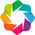

In [2]:
hv.extension('bokeh')

## Start our Dask Cluster

For simple testing and illustration of how to use dask, holoview, and datashader here you can run locally on just one tract.
To run on the full set of DR6, you'll need to set up a node to support Dask distributed.  Basically you just need a machine that can hold the data in memory.

### Start a Dask Cluster on an Interactive Node

Move to your SCRATCH directory to simplify file locking.  (On NERSC, the `SCRATCH` environment variable points to an individual SCRATCH area for each user.)
```
cd $SCRATCH/
```

In a separate Terminal on Cori (a JupyterHub Terminal works fine), ask for a Node from the `interactive` queue.  This generally completes in seconds.
```
salloc -N 1 -C haswell --qos=interactive -t 04:00:00
```

And then once on that Node, load the right Python environment:
```
python /global/common/software/lsst/common/miniconda/start-kernel-cli.py desc-python-bleed
```

And then start up the Dask Cluster
```
NUM_WORKERS=16
SCHEDULER_FILE=${SCRATCH}/scheduler.json
rm -rf ${SCHEDULER_FILE}
dask-scheduler --scheduler-file ${SCHEDULER_FILE} &
dask-worker --nprocs ${NUM_WORKERS} --scheduler-file ${SCHEDULER_FILE} &
```

(We explicitly `rm -rf ${SCHEDULER_FILE}` above in case it's still around from a previous invocation.)

You connect to this Dask cluster by passing in the location of the `SCHEDULER_FILE`:

In [3]:
scheduler_file = os.path.join(os.environ["SCRATCH"], "scheduler.json")

We then configure the dashboard URL to use the JupyterHub proxy service.
We here set the formatting string template to the correct value.
Once we actually connect the client, the client can then tell us the full link.

In [4]:
dask.config.config["distributed"]["dashboard"]["link"] = "{JUPYTERHUB_SERVICE_PREFIX}proxy/{host}:{port}/status"

In [5]:
from dask.distributed import Client

client = Client(scheduler_file=scheduler_file)

In [6]:
client

Client Scheduler: tcp://10.128.0.49:8786 Dashboard: /user/wmwv/cori2-shared-node-cpu/proxy/10.128.0.49:8787/status,Cluster Workers: 16 Cores: 64 Memory: 126.70 GB


Click on the link after `Dashboard:` above to get a visualization of the Dask Cluster.

## Define and (lazy-)load our data

In [7]:
data_release = "dr6a"
datafile = f"/global/cfs/cdirs/lsst/shared/DC2-prod/Run2.2i/dpdd/Run2.2i-{data_release}/dc2_object_run2.2i_{data_release}"

In [8]:
# Specify the columns we need.  This allows for significant performance advantages when reading a column-based storage format such as Parquet.
columns_to_read = ['ra', 'dec', 'mag_g', 'mag_r', 'mag_i',
                   'magerr_g', 'magerr_r', 'magerr_i', 'extendedness']
df = dd.read_parquet(datafile, columns=columns_to_read, engine='pyarrow')

In [9]:
print(df.columns)

Index(['ra', 'dec', 'mag_g', 'mag_r', 'mag_i', 'magerr_g', 'magerr_r',
       'magerr_i', 'extendedness'],
      dtype='object')


## Persist the data in Dask Cluster Worker memory

Dask actively purges data from memory when its no longer needed by the Dask Task Graph currently doing the computation.

That's not what we want here where we want to plot several quantities repeatedly.  So we explicitly tell Dask to persist this data frame.

In [10]:
df = df.persist()

## Clean and Create Color Columns

In [11]:
# Clean
snr_magerr_threshold = 0.3  # mag
df = df[(df.magerr_g < snr_magerr_threshold) & (df.magerr_r < snr_magerr_threshold) & (df.magerr_i < snr_magerr_threshold)]

In [12]:
df['g-r'] = df['mag_g'] - df['mag_r']
df['r-i'] = df['mag_r'] - df['mag_i']

In [13]:
gal = df[(df.extendedness > 0.95)]
star = df[(df.extendedness < 0.95)]

## Create HoloViews `Points` objects and Wrap with Datashader

Create for position, magnitude and color.  Use datashader to provide rasterized images that display in finite time but are still zoomable.

We will first define several different HoloViews objects
Then we will use the `+` overloading to display the visualizations.

For some more examples and information, see
https://holoviews.org/user_guide/Large_Data.html

In [37]:
points_ra_dec = hv.Points(df, kdims=['ra', 'dec'])
ra_dec = datashade(points_ra_dec)

In [38]:
ra_dec

:DynamicMap   []
   :RGB   [ra,dec]   (R,G,B,A)

In [39]:
points_mag_magerr = hv.Points(df, kdims=[hv.Dimension('mag_g', soft_range=(14, 28)),
                                         hv.Dimension('magerr_g', range=(0, snr_magerr_threshold))])
mag_magerr = datashade(points_mag_magerr)

In [40]:
points_color_mag = hv.Points(df, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                        hv.Dimension('mag_g', soft_range=(14, 28))])
color_mag = datashade(points_color_mag)

In [41]:
points_color_color = hv.Points(df, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                          hv.Dimension('r-i', soft_range=(-2, 3))])
color_color = datashade(points_color_color)

In Holoviews one uses the `+` operator to put these three different visualizations next to each other.

In [42]:
mag_magerr + color_mag + color_color

:Layout
   .DynamicMap.I   :DynamicMap   []
      :RGB   [mag_g,magerr_g]   (R,G,B,A)
   .DynamicMap.II  :DynamicMap   []
      :RGB   [g-r,mag_g]   (R,G,B,A)
   .DynamicMap.III :DynamicMap   []
      :RGB   [g-r,r-i]   (R,G,B,A)

The color-magnitude and color-color plots will zoom together.  The synchronized range zooming is just based on matching the range of g-r. it's not subsetting the points in the view.  Thus there is no relationship between the RA, Dec plot and the other plots.

Related to this, I don't know how to invert the mag_g axis in the middle plot without also inverting the mag_g axis in the left plot and without breaking the shared axes selections.  One can `color_mag.opts(invert_yaxis=True)`, but that would not just invert the `mag_magerr` plot axis, which would be annoying, but even worse it would invert the linked selection to be 28 < mag_g < 14, which is the empty set.

## Datashade Multiple Sets

Show how to separate by `extendedness` parameter.  Note that `extendedness` is pretty conservative with a high false negative at faint magnitudes.

In [18]:
# I have to force the range for magerr with 'range' instead of 'soft_range'.  I'm not sure why.
gal_mag_magerr = hv.Points(gal, kdims=[hv.Dimension('mag_g', soft_range=(14, 28)),
                                       hv.Dimension('magerr_g', range=(0, snr_magerr_threshold))])
gal_color_mag = hv.Points(gal, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                      hv.Dimension('mag_g', soft_range=(14, 28))])
gal_color_color = hv.Points(gal, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                        hv.Dimension('r-i', soft_range=(-2, 3))])

star_mag_magerr = hv.Points(star, kdims=[hv.Dimension('mag_g', soft_range=(14, 28)),
                                       hv.Dimension('magerr_g', range=(0, snr_magerr_threshold))])
star_color_mag = hv.Points(star, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                        hv.Dimension('mag_g', soft_range=(14, 28))])
star_color_color = hv.Points(star, kdims=[hv.Dimension('g-r', soft_range=(-2, 3)),
                                          hv.Dimension('r-i', soft_range=(-2, 3))])

typed_mag_magerr = {'gal': gal_mag_magerr, 'star': star_mag_magerr}
typed_color_mag = {'gal': gal_color_mag, 'star': star_color_mag}
typed_color_color = {'gal': gal_color_color, 'star': star_color_color}

shaded_mag_magerr = datashade(hv.NdOverlay(typed_mag_magerr, kdims='type'),
                              aggregator=ds.count_cat('type'))
shaded_color_mag = datashade(hv.NdOverlay(typed_color_mag, kdims='type'),
                             aggregator=ds.count_cat('type'))
shaded_color_color = datashade(hv.NdOverlay(typed_color_color, kdims='type'),
                               aggregator=ds.count_cat('type'))

In [19]:
shaded_mag_magerr + shaded_color_mag + shaded_color_color

:Layout
   .DynamicMap.I   :DynamicMap   []
      :RGB   [mag_g,magerr_g]   (R,G,B,A)
   .DynamicMap.II  :DynamicMap   []
      :RGB   [g-r,mag_g]   (R,G,B,A)
   .DynamicMap.III :DynamicMap   []
      :RGB   [g-r,r-i]   (R,G,B,A)

The galaxies are red, while the "stars" (== not obviously extended) are blue.

Zoom in to mag - magerr plot to see that the outlying cluster of higher uncertainties as a function of magnitude are galaxies.

Notes:  
1. Constructing a legend for the above is unfortunately a little unobvious and awkward.  We lost the information when we datashaded the NdOverlay.  You could do it by creating a new set of empty NdOverlay object to get the colors. 

This is relying on the fact that the above commands used the default color map.  
Explicitly specifying the color above would have been better.
```
from datashader.colors import Sets1to3 # default datashade() and shade() color cycle
color_key = {k: Sets1to3[i] for i, k in enumerate(typed_color_mag)}
color_points = hv.NdOverlay({k: hv.Points([gal['g-r'][0], gal['mag_g'][0]],
                                          label=str(k)).options(color=v) for k, v in color_key.items()})
                                          
shaded_color_mag * color_points + shaded_color_color * color_points
```

Above code adapted from http://holoviews.org/user_guide/Large_Data.html

## Use hover-over aggregation

We can set up a dynamic hover-over that gives information about the local area.  In this case we're just doing a count of the number of points in a given rectangular region.

Note the use of the `*` to compose the results of `datashade` and `hv.util.Dynamic`.  This is the idiom in Holoviews to combine several different visualizations/tools.

In [20]:
from holoviews.streams import RangeXY

# A funnily-named wrapper function to generate hover-overs by count.
# nx, ny are fixed by the original range.  We don't get finer resolution as we zoom in.
def dynamate(points, width=400, height=400, nx=50, ny=50):
    """Datashades points at width, height.  Hover-over in dynamic boxes of nx x ny at given display size"""
    datashaded_points = datashade(points, width=width, height=height)
    hover_over_count = \
        hv.util.Dynamic(rasterize(points, width=nx, height=ny, streams=[RangeXY]),
                        operation=hv.QuadMesh)
    return datashaded_points * hover_over_count

In [21]:
points_mag_magerr = hv.Points(df, kdims=[hv.Dimension('mag_g', soft_range=(14, 28)),
                                         hv.Dimension('magerr_g', range=(0, snr_magerr_threshold))])
mag_magerr = datashade(points_mag_magerr)

In [22]:
%%opts QuadMesh [tools=['hover']] (alpha=0 hover_alpha=0.2)
dynamic_mag_magerr = dynamate(points_mag_magerr)
dynamic_color_mag = dynamate(points_color_mag)
dynamic_color_color = dynamate(points_color_color)

In [23]:
dynamic_mag_magerr + dynamic_color_mag + dynamic_color_color

:Layout
   .DynamicMap.I   :DynamicMap   []
      :Overlay
         .RGB.I      :RGB   [mag_g,magerr_g]   (R,G,B,A)
         .QuadMesh.I :QuadMesh   [mag_g,magerr_g]   (Count)
   .DynamicMap.II  :DynamicMap   []
      :Overlay
         .RGB.I      :RGB   [g-r,mag_g]   (R,G,B,A)
         .QuadMesh.I :QuadMesh   [g-r,mag_g]   (Count)
   .DynamicMap.III :DynamicMap   []
      :Overlay
         .RGB.I      :RGB   [g-r,r-i]   (R,G,B,A)
         .QuadMesh.I :QuadMesh   [g-r,r-i]   (Count)

## Shut down Dask Cluster

When you're done, go back to your Terminal window and log out of the interactive node.  This will both shut down the Dask Cluster and log out of your interactive node job.